In [29]:
import os
import mne
import matplotlib
import numpy as np
# import pandas as pd
import matplotlib.pyplot as plt
from mne.preprocessing import (ICA, create_eog_epochs)
# from pylab import rcParams
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from pyprep.find_noisy_channels import NoisyChannels

In [30]:
# matplotlib.use("Qt5Agg")
%matplotlib inline
mne.set_config("MNE_USE_CUDA", "true")

In [31]:
# set path
data_path = "D:\\EGI_DATA\\EGI_BIDS"
eeg_path = "eeg"
# set task name
foodtask = "foodchoice"
wordtask = "wordchoice"
imagetask = "imagechoice"
# witask = "wordimagematch"
rest = "rest"
# epoch windows
tmin = -0.3
tmax = 1
random_state = 97

In [32]:
montage_dir = os.path.join(os.path.dirname(mne.__file__),
                           'channels', 'data', 'montages')
print('\nBUILT-IN MONTAGE FILES')
print('======================')
print(sorted(os.listdir(montage_dir)))


BUILT-IN MONTAGE FILES
['EGI_256.csd', 'GSN-HydroCel-128.sfp', 'GSN-HydroCel-129.sfp', 'GSN-HydroCel-256.sfp', 'GSN-HydroCel-257.sfp', 'GSN-HydroCel-32.sfp', 'GSN-HydroCel-64_1.0.sfp', 'GSN-HydroCel-65_1.0.sfp', 'biosemi128.txt', 'biosemi16.txt', 'biosemi160.txt', 'biosemi256.txt', 'biosemi32.txt', 'biosemi64.txt', 'easycap-M1.txt', 'easycap-M10.txt', 'mgh60.elc', 'mgh70.elc', 'standard_1005.elc', 'standard_1020.elc', 'standard_alphabetic.elc', 'standard_postfixed.elc', 'standard_prefixed.elc', 'standard_primed.elc']


## read data

In [33]:
sub = "sub-014"
task = wordtask

In [34]:
raw = mne.io.read_raw_edf(os.path.join(data_path, sub, eeg_path, "{}_task-{}_eeg.edf".format(sub, task)), preload=True)

Extracting EDF parameters from D:\EGI_DATA\EGI_BIDS\sub-014\eeg\sub-014_task-wordchoice_eeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1323999  =      0.000 ...  1323.999 secs...


In [ ]:
raw = mne.io.read_raw_edf(os.path.join(data_path, sub, eeg_path, "{}_task-{}_eeg.edf".format(sub, task)), preload=True)

In [35]:
# %matplotlib inline
# raw.plot(duration=30, start=200, n_channels=32, scalings=0.0005)
# plt.show()

## set montage

In [41]:
montage = mne.channels.make_standard_montage("GSN-HydroCel-129")
montage.ch_names[-1] = "E129"

Creating RawArray with float64 data, n_channels=129, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


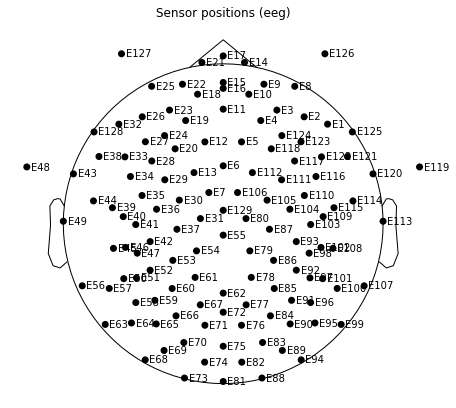

In [42]:
montage.plot()
plt.show()

In [38]:
raw.set_montage(montage)

<RawEDF | sub-014_task-wordchoice_eeg.edf, 129 x 1324000 (1324.0 s), ~1.27 GB, data loaded>

## filter data

In [34]:
raw_filetered = raw.copy().notch_filter(np.arange(50, 250, 50), n_jobs="cuda")
raw_filetered.filter(l_freq=1, h_freq=30, n_jobs="cuda")

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 6601 samples (6.601 sec)

Using CUDA for FFT FIR filtering
Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (3.301 sec)

Using CUDA for FFT FIR filt

<RawEDF | sub-012_task-wordchoice_eeg.edf, 129 x 1490000 (1490.0 s), ~1.43 GB, data loaded>

## resample

In [35]:
raw_downsampled = raw_filetered.copy().resample(sfreq=256, n_jobs="cuda")

Using CUDA for FFT resampling


In [36]:
# detect noisy channel
# filt_raw = raw.copy()
# filt_raw.drop_channels(["E129"])
# nd = NoisyChannels(filt_raw, random_state=56)
# nd.find_bad_by_ransac(n_samples=50, channel_wise=True)

## read events

In [37]:
events = mne.events_from_annotations(raw_downsampled)

Used Annotations descriptions: ['0000', '0001', '0002', '0003', '0004', '0005', '0006', '0007', '0008', '0009', '0010', '0011', '0012', '0013', '0014', '0015', '0016', '0017', '0018', '0019', '0020', '0021', '0022', '0023', '0024', '0025', '0026', '0027', '0028', '0029', '0030', '0031', '0032', '0033', '0034', '0035', '0036', '0037', '0038', '0039', '0040', '0041', '0042', '0043', '0044', '0045', '0046', '0047', '0048', '0049', '0050', '0051', '0052', '0053', '0054', '0055', '0056', '0057', '0058', '0059', '0060', '0061', '0062', '0063', '0064', '0065', '0066', '0067', '0068', '0069', '0070', '0071', '0072', '0073', '0074', '0075', '0076', '0077', '0078', '0079', '0080', '0081', '0082', '0083', '0084', '0085', '0086', '0087', '0088', '0089', '0090', '0091', '0092', '0093', '0094', '0095', '0096', '0097', '0098', '0099', '0100', '0101', '0102', '0103', '0104', '0105', '0106', '0107', '0108', '0109', '0110', '0111', '0112', '0113', '0114', '0115', '0116', '0117', '0118', '0119', '0120', 

In [38]:
len(events[0])

960

In [39]:
max_id = max(events[0][:,2])
stim_event_dict = {"animate/left": max_id + 1, "animate/right": max_id + 2, "inanimate/left": max_id + 3, "inanimate/right": max_id + 4}

In [40]:
 if task == foodtask:
    stim_event_dict = {"left": max_id + 1, "right": max_id + 2}
    resp_left = [events[1].get("0500", -1)]
    resp_right = [events[1].get("0501", -1)]
    stim_list = [events[1].get("0400", -1)]

    stim_events = []
    events_n = len(events[0])
    for i in range(events_n - 1):
        # current mark: stimulus mark
        if events[0][i][2] in stim_list:
            if events[0][i+1][2] in resp_left:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["left"]])
            elif events[0][i+1][2] in resp_right:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["right"]])

In [41]:
if task in [imagetask, wordtask]:
    ani_left = [events[1].get(eve_id, -1) for eve_id in ["0500", "0502"]]
    ani_right = [events[1].get(eve_id, -1) for eve_id in ["0504", "0506"]]
    inani_left = [events[1].get(eve_id, -1) for eve_id in ["0501", "0503"]]
    inani_right = [events[1].get(eve_id, -1) for eve_id in ["0505", "0507"]]
    stim_list = [events[1].get(eve_id, -1) for eve_id in ["0400", "0401", "0402", "0403"]]

    stim_events = []
    events_n = len(events[0])
    for i in range(events_n - 1):
        # current mark: stimulus mark
        if events[0][i][2] in stim_list:
            if events[0][i+1][2] in ani_left:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["animate/left"]])
            elif events[0][i+1][2] in ani_right:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["animate/right"]])
            elif events[0][i+1][2] in inani_left:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["inanimate/left"]])
            elif events[0][i+1][2] in inani_right:
                stim_events.append([events[0][i][0], events[0][i][1], stim_event_dict["inanimate/right"]])

In [42]:
index_id = [events[1].get(eve_id, -1) for eve_id in ["{:04d}".format(i) for i in range(320)]]
id2event = {value: key for key, value in events[1].items()}
index_event = []
for i in range(events_n):
    if events[0][i][2] in index_id:
        index_event.append([events[0][i][0], events[0][i][1], id2event[events[0][i][2]]])

In [44]:
stim_events = np.array(stim_events)

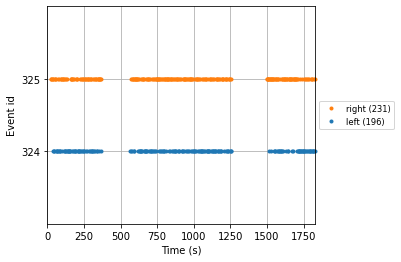

In [21]:
# mne.viz.plot_events(stim_events, sfreq=raw_downsampled.info["sfreq"], first_samp=raw_downsampled.first_samp, event_id=stim_event_dict)
# plt.show()

## detect EOG event

In [109]:
# raw_downsampled = mne.set_bipolar_reference(raw_downsampled, ["E8"], ["E126"], ["EVR"])
# raw_downsampled = mne.set_bipolar_reference(raw_downsampled, ["E25"], ["E127"], ["EVL"])
# raw_downsampled.set_channel_types({"EVR": "eog", "EVL": "eog"})
eog_chan = ["E1", "E8", "E14", "E17", "E21", "E25", "E32", "E38", "E121", "E126", "E127"]
eog_type = ["eog"] * len(eog_chan)

In [110]:
raw_downsampled.set_channel_types(dict(zip(eog_chan, eog_type)))

<RawEDF | sub-013_task-imagechoice_eeg.edf, 129 x 447232 (1747.0 s), ~440.3 MB, data loaded>

In [111]:
raw_downsampled.info

<Info | 8 non-empty values
 bads: []
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 11 EOG, 118 EEG
 custom_ref_applied: False
 dig: 132 items (3 Cardinal, 129 EEG)
 highpass: 1.0 Hz
 lowpass: 30.0 Hz
 meas_date: 2020-12-09 19:07:32 UTC
 nchan: 129
 projs: []
 sfreq: 256.0 Hz
>

In [112]:
# raw_downsampled.plot(duration=30, start=120, n_channels=129, scalings=0.0001)
# plt.show()

In [113]:
eog_events = mne.preprocessing.find_eog_events(raw_downsampled)
# eog_events = mne.preprocessing.find_eog_events(raw_downsampled, thresh=0.0001)

EOG channel index for this subject is: [  0   7  13  16  20  24  31  37 120 125 126]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 6 significant peaks
Number of EOG events detected : 6


In [114]:
onsets = eog_events[:, 0] / raw_downsampled.info["sfreq"] - 0.25
durations = [0.5] * len(eog_events)
descriptions = ["bad blink"] * len(eog_events)
blink_annot = mne.Annotations(onsets, durations, descriptions, orig_time=raw_downsampled.info["meas_date"])

In [115]:
# raw_downsampled.plot(events=eog_events, scalings=0.0001)
# plt.show()

In [116]:
raw_downsampled.set_annotations(blink_annot)

<ipython-input-116-fd4ea9389f88>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_downsampled.set_annotations(blink_annot)


<RawEDF | sub-013_task-imagechoice_eeg.edf, 129 x 447232 (1747.0 s), ~440.3 MB, data loaded>

In [117]:
# # %matplotlib qt
# raw_downsampled.plot(duration=30, start=100, n_channels=32, scalings=0.0001)
# plt.show()

## drop bad channel

In [118]:
bad_channel = ["E125", "E128", "E43", "E48", "E49", "E56", "E63", "E68", "E73", "E81", "E88", "E94", "E99", "E107", "E113", "E120", "E119"]

In [119]:
raw_mark_bad = raw_downsampled.copy()

In [120]:
raw_mark_bad.info["bads"] = bad_channel

In [121]:
raw_mark_bad.drop_channels(bad_channel)

<RawEDF | sub-013_task-imagechoice_eeg.edf, 112 x 447232 (1747.0 s), ~382.3 MB, data loaded>

## re-reference

In [122]:
raw_ref = raw_mark_bad.copy().set_eeg_reference("average", ch_type="eeg")

Applying average reference.
Applying a custom EEG reference.


In [123]:
# %matplotlib inline
# raw_ref.plot(duration=50, start=200, n_channels=32, scalings=0.0002)
# plt.show()

## epoch data

In [124]:
epochs = mne.Epochs(raw_ref, events=stim_events, event_id=stim_event_dict, tmin=tmin, tmax=tmax, preload=True)

Not setting metadata
Not setting metadata
320 matching events found
Setting baseline interval to [-1.0, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 320 events and 1025 original time points ...
1 bad epochs dropped


In [125]:
epochs.info

<Info | 9 non-empty values
 bads: []
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 11 EOG, 101 EEG
 custom_ref_applied: True
 dig: 132 items (3 Cardinal, 129 EEG)
 highpass: 1.0 Hz
 lowpass: 30.0 Hz
 meas_date: 2020-12-09 19:07:32 UTC
 nchan: 112
 projs: []
 sfreq: 256.0 Hz
>

In [126]:
# epochs.plot(n_epochs=10, scalings=0.0001, events=epochs.events, event_id=stim_event_dict, event_color={"animate/left": "red", "animate/right": "blue", "inanimate/left": "green", "inanimate/right": "yellow"})
# plt.show()

In [127]:
# epochs["animate/left"].plot_psd()
# plt.show()

In [128]:
# epochs["animate/right"].plot_psd_topomap()
# plt.show()

In [129]:
# epochs["animate/right"].average().plot()

## ICA

In [130]:
reject = get_rejection_threshold(epochs)

Estimating rejection dictionary for eeg
Estimating rejection dictionary for eog


In [131]:
reject

{'eeg': 0.00022494230525893196, 'eog': 0.0003951176399531797}

In [132]:
# reject = {"eeg": 0.0005, "eog": 0.003}

In [133]:
ica = ICA(n_components=20, random_state=random_state)

In [134]:
ica.fit(epochs, reject=reject)

Fitting ICA to data using 101 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 12.2s.


<ICA | epochs decomposition, fit (fastica): 326975 samples, 20 components, channels used: "eeg">

In [135]:
eog_inds, scores = ica.find_bads_eog(epochs)

suggested eog component: [4, 2, 10, 1]


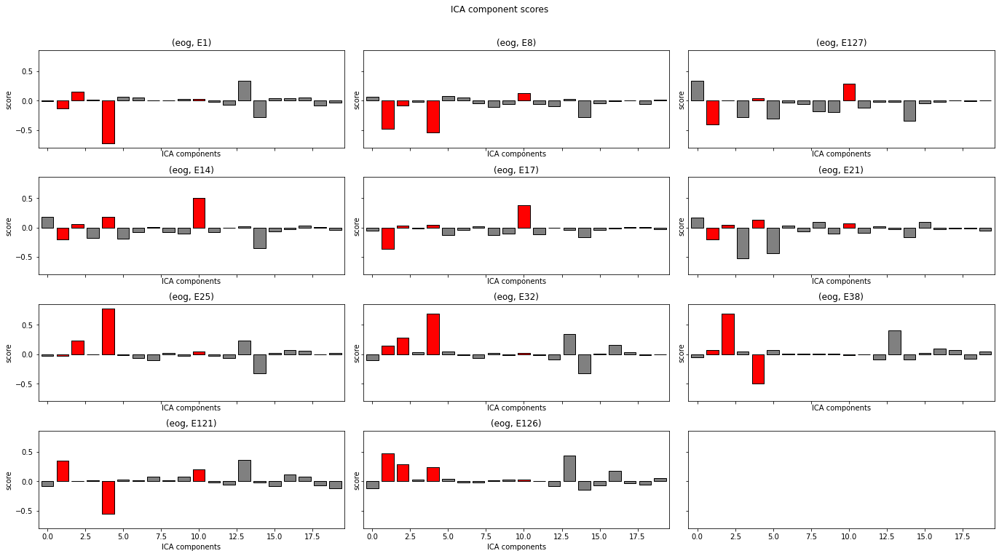

In [136]:
print("suggested eog component: " + str(eog_inds))
ica.plot_scores(scores, exclude=eog_inds, labels="eog")
plt.show()

In [137]:
# ica.plot_properties(epochs, picks=eog_inds, psd_args={"fmax": 35.}, image_args={"sigma": 1.})
# plt.show()

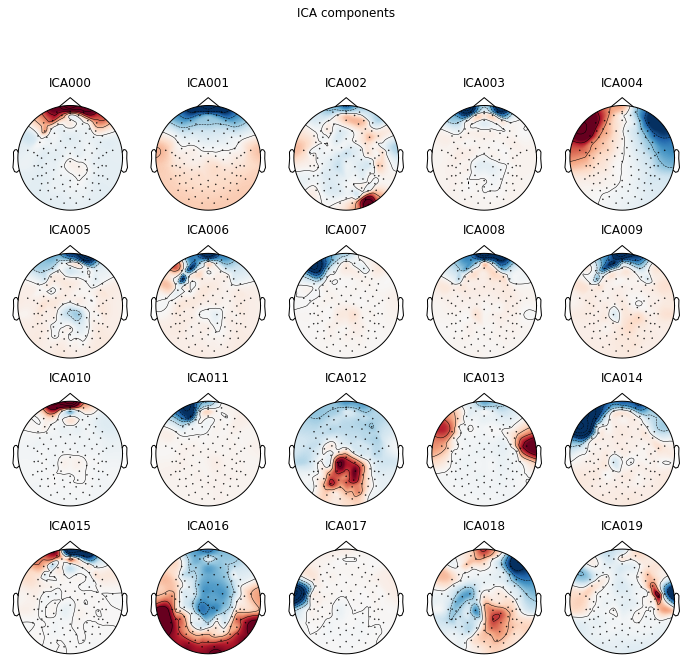

In [138]:
ica.plot_components(inst=epochs)
plt.show()

In [139]:
ica.exclude += eog_inds
ica.apply(epochs)

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 101 PCA components


<Epochs |  319 events (all good), -1 - 3 sec, baseline [-1, 0] sec, ~279.6 MB, data loaded,
 'animate/left': 81
 'animate/right': 80
 'inanimate/left': 78
 'inanimate/right': 80>

In [140]:
ar = AutoReject(random_state=random_state, n_jobs=16, verbose="tqdm")
epochs_clean = ar.fit_transform(epochs)

Computing thresholds ...: 100%|██████████| 101/101 [01:02<00:00,  1.62it/s]


Repairing epochs:   0%|          | 0/319 [00:00<?, ?it/s]

Repairing epochs:  10%|█         | 32/319 [00:00<00:00, 313.73it/s]

Repairing epochs:  20%|██        | 64/319 [00:00<00:00, 304.93it/s]

Repairing epochs:  30%|███       | 96/319 [00:00<00:00, 307.53it/s]

Repairing epochs:  40%|███▉      | 127/319 [00:00<00:00, 303.80it/s]

Repairing epochs:  50%|████▉     | 158/319 [00:00<00:00, 304.91it/s]

Repairing epochs:  59%|█████▉    | 189/319 [00:00<00:00, 304.53it/s]

Repairing epochs:  69%|██████▉   | 220/319 [00:00<00:00, 301.49it/s]

Repairing epochs:  79%|███████▊  | 251/319 [00:00<00:00, 300.40it/s]

Repairing epochs:  88%|████████▊ | 282/319 [00:00<00:00, 299.67it/s]

Repairing epochs: 100%|██████████| 319/319 [00:01<00:00, 302.08it/s]

n_interp:   0%|          | 0/3 [00:00<?, ?it/s]

Repairing epochs:   0%|          | 0/319 [00:00<?, ?it/s]

Repairing epochs:   2%|▏         | 6/319 [00:00<00:05, 56.

In [76]:
epochs_clean.info

<Info | 9 non-empty values
 bads: []
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 11 EOG, 101 EEG
 custom_ref_applied: True
 dig: 132 items (3 Cardinal, 129 EEG)
 highpass: 1.0 Hz
 lowpass: 30.0 Hz
 meas_date: 2020-12-07 13:38:04 UTC
 nchan: 112
 projs: []
 sfreq: 256.0 Hz
>

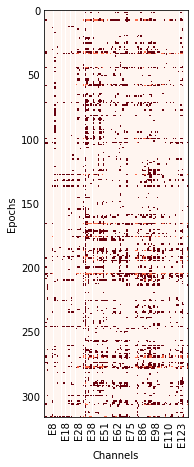

In [75]:
ar.get_reject_log(epochs).plot()
plt.show()

In [55]:
len(epochs.events)

316

In [56]:
len(epochs_clean.events)

169

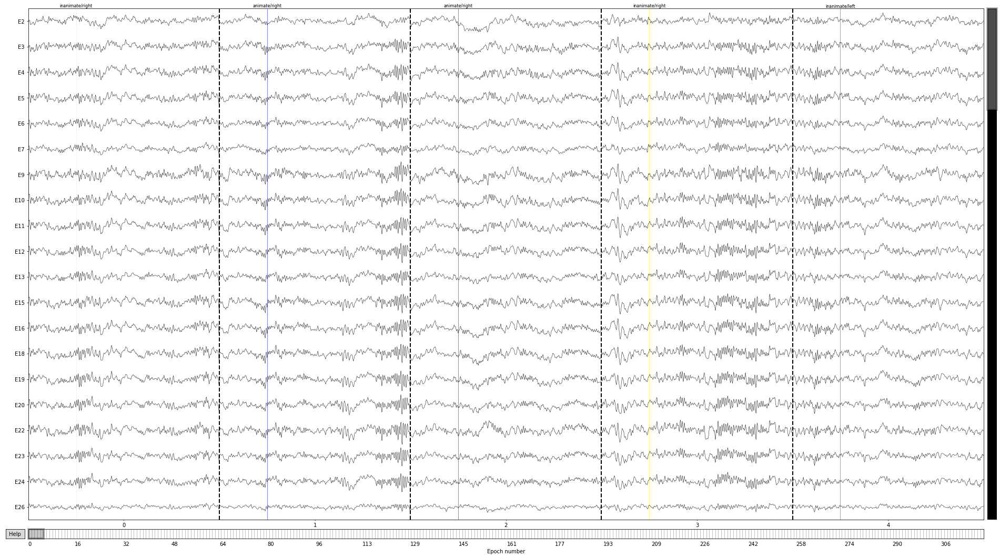

In [77]:
epochs.plot(n_epochs=5, scalings=0.00003, events=epochs.events, event_id=stim_event_dict, event_color={"animate/left": "red", "animate/right": "blue", "inanimate/left": "green", "inanimate/right": "yellow"})
plt.show()

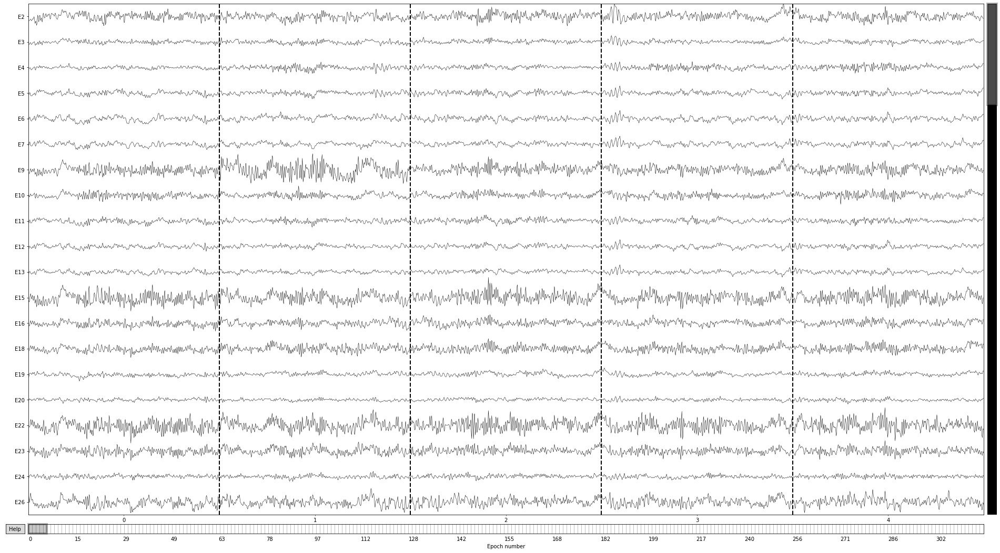

In [161]:
epochs_clean.plot(n_epochs=5, scalings=0.00003)
plt.show()

No projector specified for this dataset. Please consider the method self.add_proj.


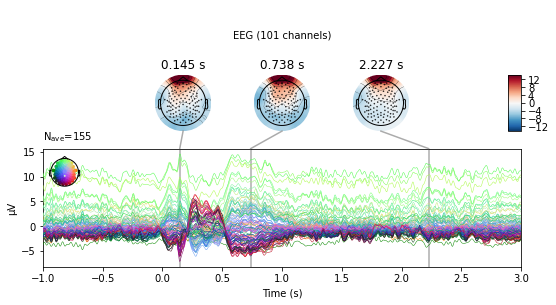

In [81]:
epochs_clean["animate"].pick_types(eeg=True, eog=False).average().plot_joint()
plt.show()

No projector specified for this dataset. Please consider the method self.add_proj.


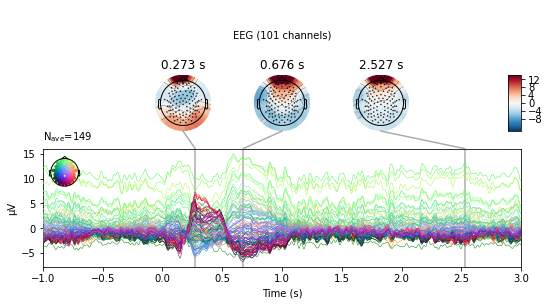

In [82]:
epochs_clean["inanimate"].average().plot_joint()
plt.show()

In [83]:
evks = epochs.copy().average()

In [96]:
# evks.plot_topo()

In [102]:
# mne.viz.plot_compare_evokeds(evks, picks="E129", colors=dict(animate=0, inanimate=1), linestyles=dict(left='solid', right='dashed'))

Not setting metadata
Not setting metadata
155 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


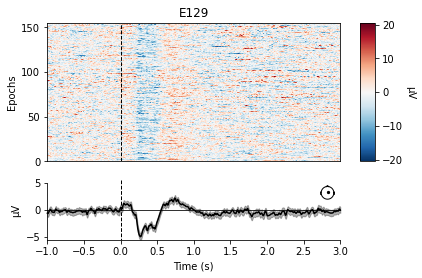

[<Figure size 432x288 with 4 Axes>]

In [84]:
epochs_clean["animate"].plot_image(picks="E129")

In [46]:
epochs_clean["inanimate"].plot_image(picks="E129")

NameError: name 'epochs_clean' is not defined

More than 6 channels, truncating title ...
Not setting metadata
Not setting metadata
304 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
combining channels using "mean"


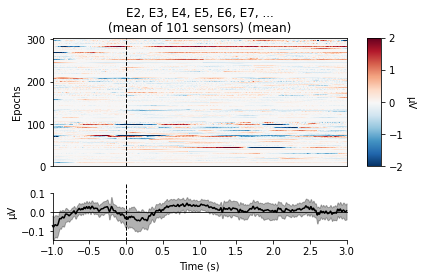

[<Figure size 432x288 with 3 Axes>]

In [87]:
epochs_clean.plot_image(picks=mne.pick_types(epochs_clean.info, eeg=True), combine="mean", vmin=-2, vmax=2)

## time frequency

In [47]:
from mne.time_frequency import tfr_morlet, psd_multitaper, psd_welch

In [89]:
# define frequencies of interest (log-spaced)
freqs = np.logspace(*np.log10([1, 30]), num=8)
# different number of cycle per frequency
n_cycles = freqs / 2.

In [48]:
tfr_morlet?

Signature:
tfr_morlet(
    inst,
    freqs,
    n_cycles,
    use_fft=False,
    return_itc=True,
    decim=1,
    n_jobs=1,
    picks=None,
    zero_mean=True,
    average=True,
    output='power',
    verbose=None,
)
Docstring:
Compute Time-Frequency Representation (TFR) using Morlet wavelets.

Same computation as `~mne.time_frequency.tfr_array_morlet`, but
operates on `~mne.Epochs` objects instead of
:class:`NumPy arrays <numpy.ndarray>`.

Parameters
----------
inst : Epochs | Evoked
    The epochs or evoked object.
freqs : ndarray, shape (n_freqs,)
    The frequencies in Hz.
n_cycles : float | ndarray, shape (n_freqs,)
    The number of cycles globally or for each frequency.
use_fft : bool, default False
    The fft based convolution or not.
return_itc : bool, default True
    Return inter-trial coherence (ITC) as well as averaged power.
    Must be ``False`` for evoked data.
decim : int | slice, default 1
    To reduce memory usage, decimation factor after time-frequency
    decom

In [92]:
power, itc = tfr_morlet(epochs_clean, freqs=freqs, n_cycles=n_cycles, picks=mne.pick_types(epochs_clean.info, eeg=True),  use_fft=True, return_itc=True, decim=3, n_jobs=16)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done  56 tasks      | elapsed:    0.8s
[Parallel(n_jobs=16)]: Done 101 out of 101 | elapsed:    1.4s finished


Applying baseline correction (mode: logratio)


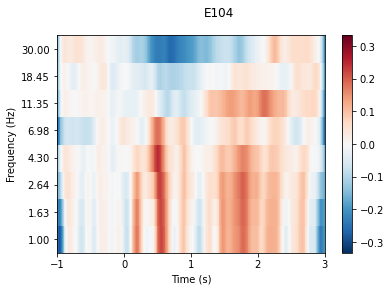

In [93]:
power.plot(["E104"], baseline=(None, 0), mode="logratio", title="E104")
plt.show()

    Using multitaper spectrum estimation with 7 DPSS windows


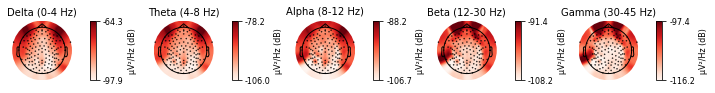

In [277]:
epochs_clean.pick_types(eeg=True, eog=False).plot_psd_topomap()
plt.show()

In [192]:
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 10,
}

Applying baseline correction (mode: logratio)
Applying baseline correction (mode: logratio)
Applying baseline correction (mode: logratio)
Applying baseline correction (mode: logratio)


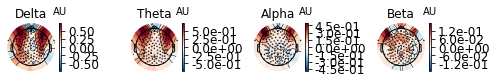

In [209]:
fig, axis = plt.subplots(1, 4, figsize=(7, 4))
power.plot_topomap(tmin=tmin, tmax=tmax, fmin=0, fmax=4, baseline=(-0.5, 0), mode="logratio", axes=axis[0], title="Delta", show=False)
power.plot_topomap(tmin=tmin, tmax=tmax, fmin=4, fmax=8, baseline=(-0.5, 0), mode="logratio", axes=axis[1], title="Theta", show=False)
power.plot_topomap(tmin=tmin, tmax=tmax, fmin=8, fmax=12, baseline=(-0.5, 0), mode="logratio", axes=axis[2], title="Alpha", show=False)
power.plot_topomap(tmin=tmin, tmax=tmax, fmin=12, fmax=25, baseline=(-0.5, 0), mode="logratio", axes=axis[3], title="Beta", show=False)
fig.tight_layout()
plt.show()

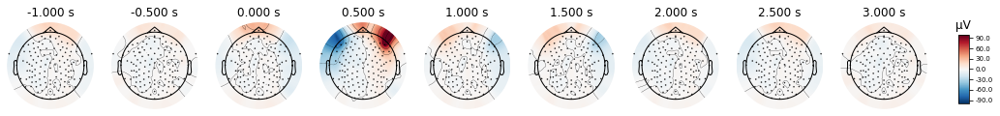

In [279]:
times = np.arange(-1, 3.1, 0.5)
evks = epochs_clean.copy().average()
evks.pick_types(eeg=True, eog=False).plot_topomap(times, time_unit='s')
plt.show()

## test

In [85]:
test_raw = raw.copy()
nd = NoisyChannels(test_raw)
nd.find_bad_by_ransac(n_samples=50, channel_wise=True)

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 sec)

Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 1
Total # of chunks: 129
Current chunk: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 
RANSAC done!
Setting up band-stop filter

FIR filter para

RuntimeError: EEG 61 or EEG 62 channel not found !!

In [163]:
test_raw.info["bad"] = nd.bad_by_ransac 

In [164]:
test_raw.notch_filter(np.arange(50, 250, 50))
test_raw.filter(1, 30)
test_raw.interpolate_bads(reset_bads=True, mode="accurate")
test_raw.resample(200)
test_raw.set_eeg_reference("average")

ValueError: h_freq ([ 49.375  99.25  149.125 199.   ]) must be less than the Nyquist frequency 100.0

In [ ]:
eog_evoked = create_eog_epochs(test_raw).average()